# Individual Assignment
- Author: William Chan
- Course: GMMA 869 - Machine Learning and AI
- Question: 1

# a. Load, Clean, and preprocess the data as you find necessary
# Import Packages

In [1]:
# Import packages we need for preprocessing, clustering, and performance metrics
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pandas_profiling
import itertools

from sklearn.cluster import KMeans, DBSCAN
import sklearn.metrics
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.preprocessing import StandardScaler

from yellowbrick.cluster import SilhouetteVisualizer, InterclusterDistance, KElbowVisualizer
from kmodes.kmodes import KModes


/opt/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.metrics.classification module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)


# Read .csv Data

In [2]:
df = pd.read_csv('/Users/williamchan/Desktop/jewelry_customers.csv')

# Data Profiling

In [117]:
# Understand the data shape
list(df)
df.shape
df.info()
df.describe().transpose()
df.head(n=10)
df.tail()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 505 entries, 0 to 504
Data columns (total 4 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Age            505 non-null    int64  
 1   Income         505 non-null    int64  
 2   SpendingScore  505 non-null    float64
 3   Savings        505 non-null    float64
dtypes: float64(2), int64(2)
memory usage: 15.9 KB


,Age,Income,SpendingScore,Savings
500,28,101206,0.387441,14936.775389
501,93,19934,0.203140,17969.693769
502,90,35297,0.355149,16091.401954
503,91,20681,0.354679,18401.088445
504,89,30267,0.289310,14386.351880


In [118]:
# Understand the data - pull stats
pandas_profiling.ProfileReport(df)

# Data Scaling

In [3]:
# Copy unscaled data into new data frame for scaling
df_scaled = df.copy()
df_scaled.head(10)

,Age,Income,SpendingScore,Savings
0,58,77769,0.791329,6559.829923
1,59,81799,0.791082,5417.661426
2,62,74751,0.702657,9258.992965
3,59,74373,0.765680,7346.334504
4,87,17760,0.348778,16869.507130
5,29,131578,0.847034,3535.514352
6,54,76500,0.785198,6878.884249
7,87,42592,0.355290,18086.287158
8,83,34384,0.324719,14783.379086
9,84,27693,0.367063,17879.558906


In [4]:
# Scale the data
scaler = StandardScaler()
features = ['Age',
 'Income',
 'SpendingScore',
 'Savings',]
df_scaled[features] = scaler.fit_transform(df_scaled[features])

print(df_scaled)

          Age    Income  SpendingScore   Savings
0   -0.042287  0.062733       1.103593 -1.072467
1   -0.000821  0.174811       1.102641 -1.303473
2    0.123577 -0.021200       0.761727 -0.526556
3   -0.000821 -0.031712       1.004705 -0.913395
4    1.160228 -1.606165      -0.602619  1.012686
..        ...       ...            ...       ...
500 -1.286268  0.714535      -0.453557  0.621787
501  1.409024 -1.545704      -1.164109  1.235201
502  1.284626 -1.118447      -0.578054  0.855313
503  1.326092 -1.524929      -0.579866  1.322452
504  1.243160 -1.258335      -0.831890  0.510463

[505 rows x 4 columns]


# Determine Number of Clusters using Elbow Method

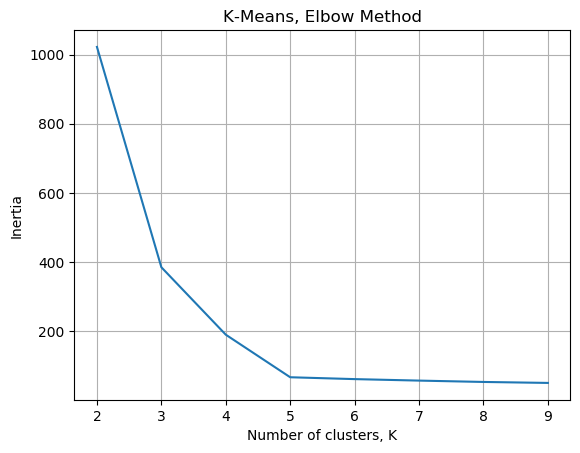

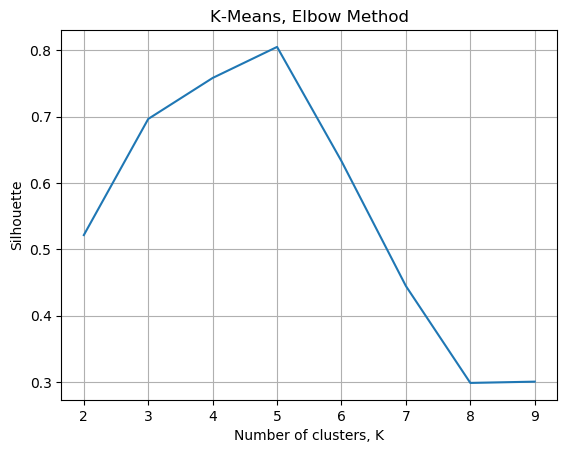

In [121]:
inertias = {}
silhouettes = {}
for k in range(2, 10):
    kmeans = KMeans(init='k-means++', n_init=10, n_clusters=k, max_iter=1000, random_state=28).fit(df_scaled)
    inertias[k] = kmeans.inertia_ # Inertia: Sum of distances of samples to their closest cluster center
    silhouettes[k] = silhouette_score(df_scaled, kmeans.labels_, metric='euclidean')
    

plt.figure();
plt.grid(True);
plt.plot(list(inertias.keys()), list(inertias.values()));
plt.title('K-Means, Elbow Method')
plt.xlabel("Number of clusters, K");
plt.ylabel("Inertia");
plt.savefig('/Users/williamchan/Desktop/plots/mall-kmeans-elbow-interia.png');


plt.figure();
plt.grid(True);
plt.plot(list(silhouettes.keys()), list(silhouettes.values()));
plt.title('K-Means, Elbow Method')
plt.xlabel("Number of clusters, K");
plt.ylabel("Silhouette");
plt.savefig('/Users/williamchan/Desktop/plots/mall-kmeans-elbow-silhouette.png');

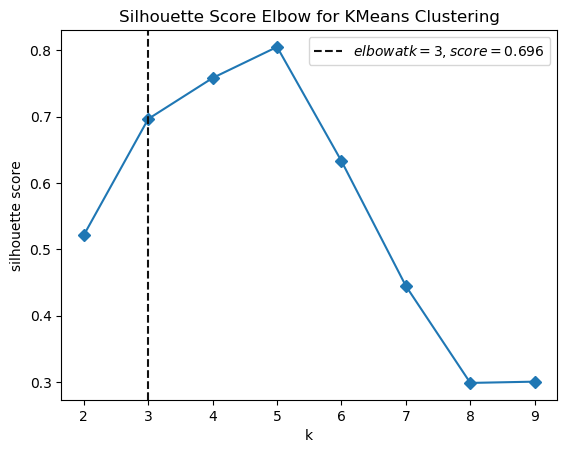

In [122]:
model = KMeans(init='k-means++', n_init=10, max_iter=1000, random_state=28)
KElbowVisualizer(model, k=(2,10), metric='silhouette', timings=False).fit(df_scaled).poof();

# b. Cluster the data using any clustering algorithm discussed in class. Measure goodness-of-fit. Try different values of hyper parameters to see how they affect goodness-of-fit.
# K-Means Method

In [5]:
# Run K-Means Algorithm
k_means = KMeans(init='k-means++', n_clusters=5, n_init=10, random_state=28)
k_means.fit(df_scaled)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=5, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=28, tol=0.0001, verbose=0)

In [6]:
# Print K-Means Cluster Numbers
k_means.labels_

array([1, 1, 1, 1, 2, 3, 1, 2, 2, 2, 4, 0, 0, 0, 1, 4, 1, 2, 2, 4, 0, 4,
       1, 2, 4, 3, 3, 1, 2, 1, 1, 1, 2, 1, 0, 1, 2, 1, 0, 0, 1, 2, 3, 1,
       1, 3, 4, 3, 0, 1, 2, 0, 3, 2, 1, 2, 0, 2, 2, 2, 2, 2, 2, 1, 1, 1,
       2, 3, 3, 1, 1, 0, 2, 2, 0, 1, 0, 1, 1, 3, 1, 4, 1, 2, 2, 0, 0, 1,
       1, 1, 1, 1, 3, 2, 1, 3, 0, 1, 1, 0, 0, 3, 0, 3, 0, 2, 2, 0, 0, 1,
       2, 0, 1, 0, 0, 0, 1, 0, 3, 2, 0, 2, 2, 2, 0, 4, 1, 2, 1, 1, 0, 1,
       0, 1, 3, 2, 4, 3, 1, 0, 2, 1, 1, 3, 1, 3, 1, 4, 1, 2, 1, 0, 2, 1,
       2, 4, 0, 1, 2, 1, 0, 2, 1, 0, 2, 0, 2, 1, 0, 1, 2, 1, 0, 1, 2, 1,
       1, 2, 2, 2, 1, 1, 0, 3, 3, 2, 0, 1, 1, 1, 0, 2, 1, 1, 1, 2, 3, 0,
       2, 2, 2, 0, 1, 0, 1, 0, 1, 2, 3, 1, 2, 2, 2, 2, 1, 2, 0, 3, 0, 2,
       1, 1, 0, 2, 0, 3, 0, 1, 1, 2, 1, 1, 2, 1, 1, 1, 0, 1, 0, 0, 3, 1,
       1, 1, 4, 1, 0, 2, 3, 3, 3, 2, 1, 0, 2, 2, 0, 0, 1, 1, 4, 1, 1, 2,
       1, 2, 0, 3, 1, 0, 2, 1, 2, 2, 0, 1, 2, 2, 1, 1, 2, 0, 0, 4, 0, 2,
       2, 0, 4, 2, 2, 3, 1, 0, 0, 1, 0, 2, 2, 0, 1,

In [13]:
# Print K-Means Cluster Centres
k_means.cluster_centers_

array([[-1.08815238,  0.82744102, -0.75240648,  0.6270464 ],
       [ 0.03879611, -0.08524639,  1.02721559, -1.00569483],
       [ 1.19238486, -1.32510593, -0.67963841,  0.97016358],
       [-1.44466803,  1.46050665,  1.51057952, -1.57249636],
       [ 1.11876151,  1.23565419, -1.68367042,  0.59588052]])

In [14]:
# Unscale clusters to derive meaning
df_unscaled = scaler.inverse_transform(k_means.cluster_centers_)
df_unscaled = pd.DataFrame (data=df_unscaled, columns=['Age',
 'Income',
 'SpendingScore',
 'Savings',])

In [12]:
df_unscaled.head(5)

NameError: name 'df_unscaled' is not defined

# Review K-Means Performance Metrics

In [128]:
# WCSS == Inertia
k_means.inertia_

66.5111137485908

In [17]:
# Silhouette Score
silhouette_score(df_scaled, k_means.labels_)

0.8048976287755765

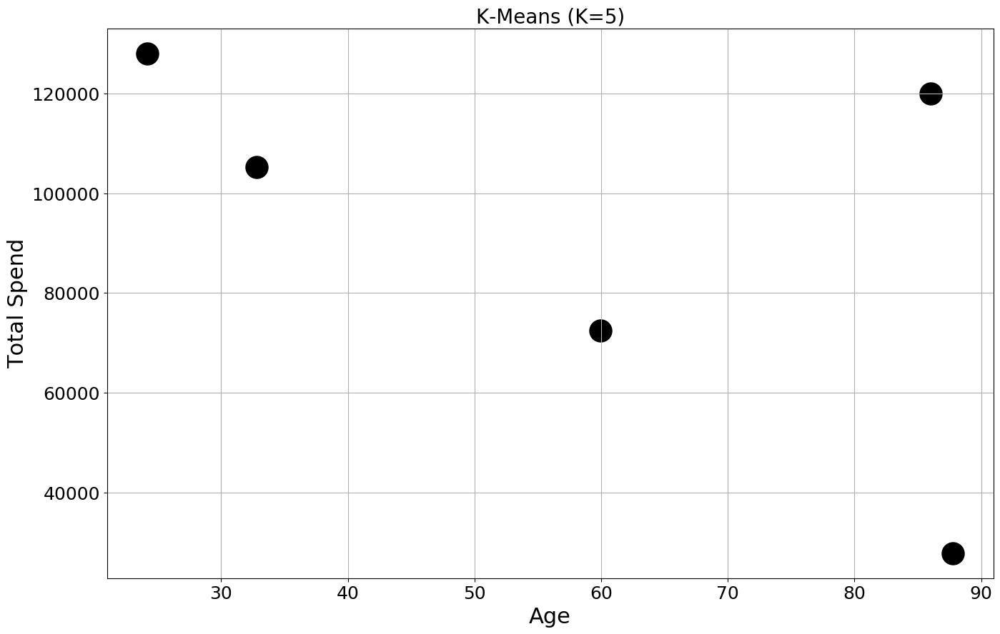

In [130]:
# Plot Clusters
plt.style.use('default');

plt.figure(figsize=(16, 10));
plt.grid(True);

sc = plt.scatter(df_unscaled['Age'], df_unscaled['Income'], s=500, c="black");
#plt.scatter(k_means.cluster_centers_[:, 3], k_means.cluster_centers_[:, 4], marker='x', s=500, c="black")
plt.title("K-Means (K=5)", fontsize=20);
plt.xlabel('Age', fontsize=22);
plt.ylabel('Total Spend', fontsize=22);
plt.xticks(fontsize=18);
plt.yticks(fontsize=18);

In [15]:
from scipy.spatial import distance

for i, label in enumerate(set(k_means.labels_)):    
    df_scaled_tmp = df_scaled[k_means.labels_==label].copy()
    
    exemplar_idx = distance.cdist([k_means.cluster_centers_[i]], df_unscaled_tmp).argmin()
    exemplar = pd.DataFrame(df_unscaled_tmp.iloc[exemplar_idx])
   
    print('\nCluster {}:'.format(label))
    exemplar

ValueError: Item wrong length 505 instead of 5.

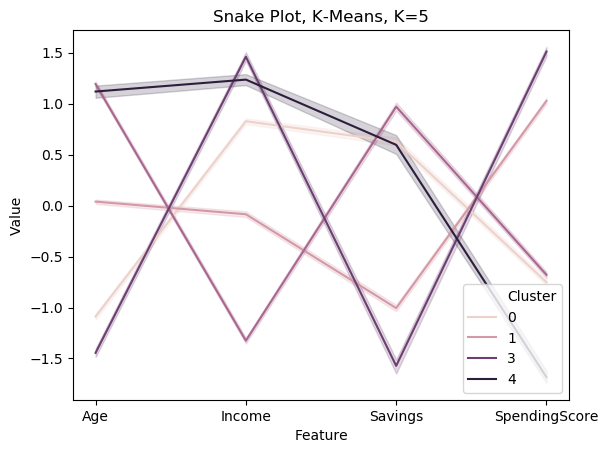

In [131]:
# Plot Snake Plot
dat = df_scaled.copy()

dat['Cluster'] = k_means.labels_

datamart_melt = pd.melt(dat.reset_index(),
id_vars=['Cluster'],
value_vars=['Age', 'Income', 'SpendingScore', 'Savings'],
var_name='Feature',
value_name='Value')

plt.title('Snake Plot, K-Means, K=5')
sns.lineplot(x="Feature", y="Value", hue='Cluster', data=datamart_melt)
plt.savefig('/Users/williamchan/Desktop/plots/a1-jewl-kmeans-snake.png', transparent=False);

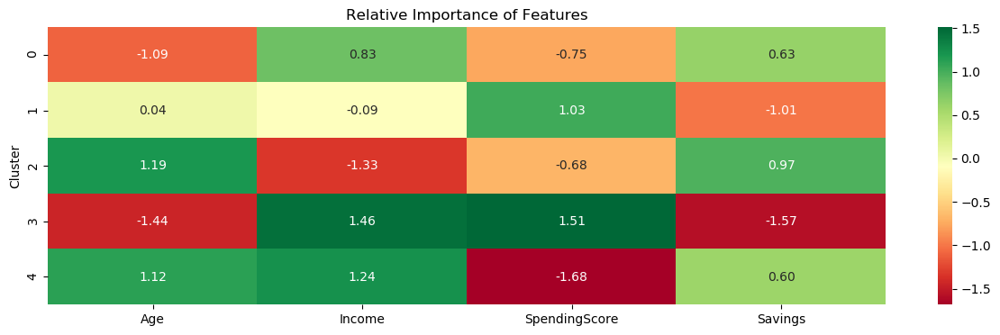

In [132]:
# Plot Relative Importance of Features
cluster_avg = dat.groupby(['Cluster']).mean()
population_avg = dat.drop(['Cluster'], axis=1).mean()

relative_imp = cluster_avg - population_avg

plt.figure(figsize=(15, 4));
plt.title('Relative Importance of Features');
sns.heatmap(data=relative_imp, annot=True, fmt='.2f', cmap='RdYlGn');
plt.savefig('/Users/williamchan/Desktop/a1-jewl-kmeans-importance.png', transparent=False);

## Experiment with Lots of Ks

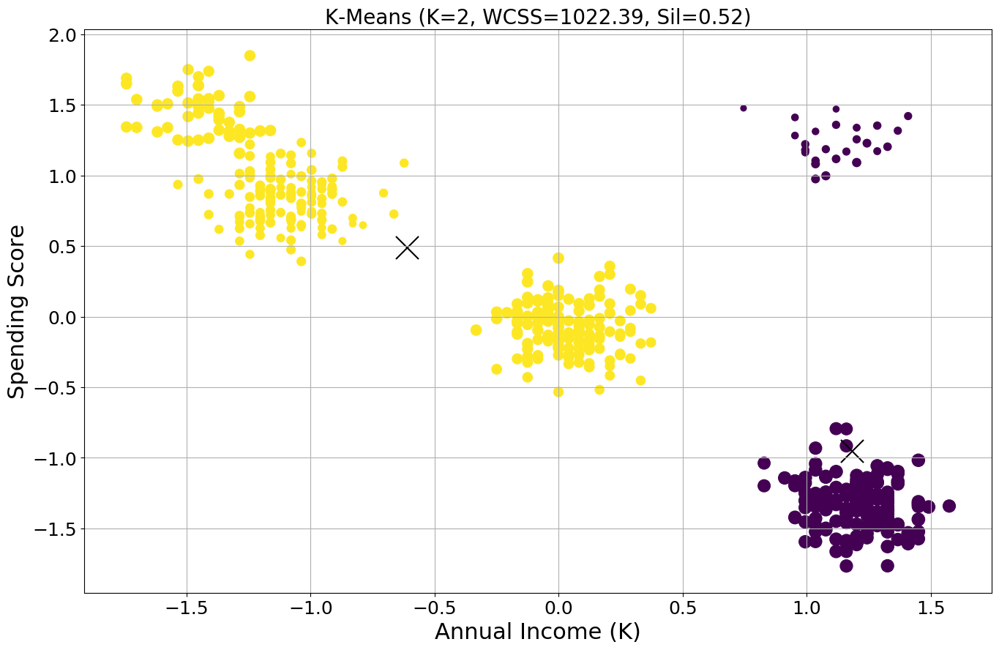

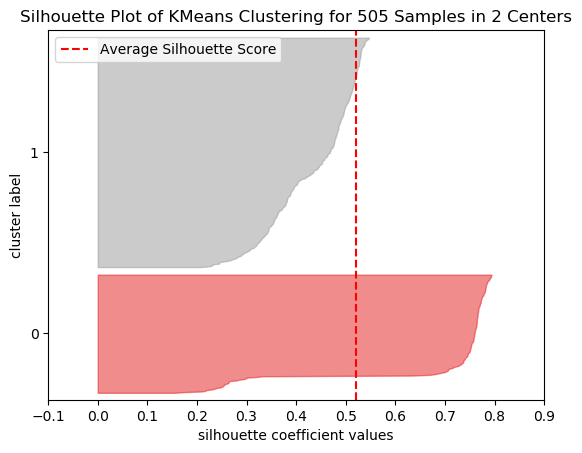

K=2, WCSS=1022.39, Sil=0.52


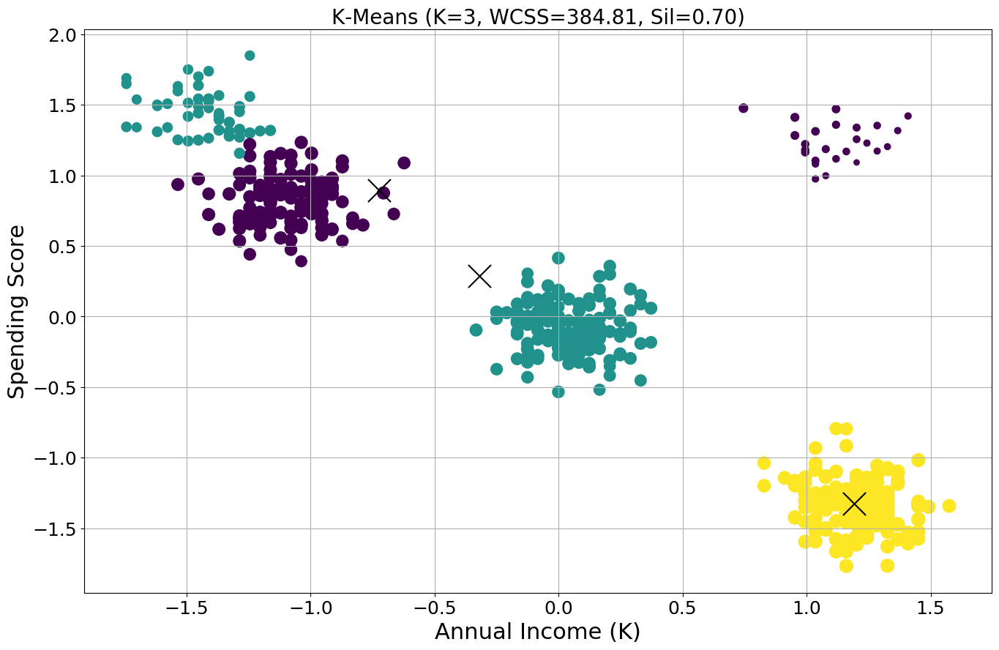

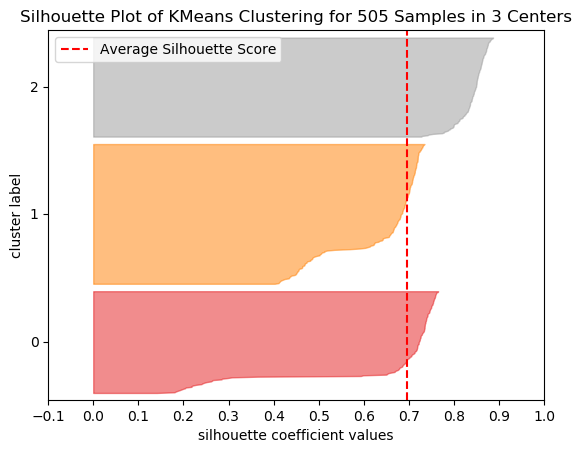

K=3, WCSS=384.81, Sil=0.70


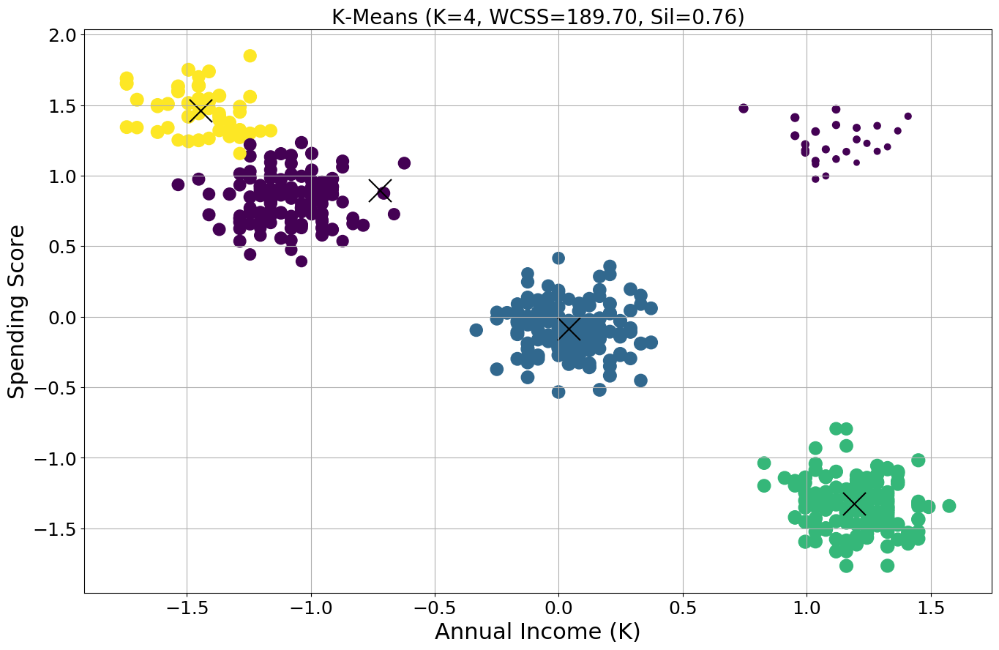

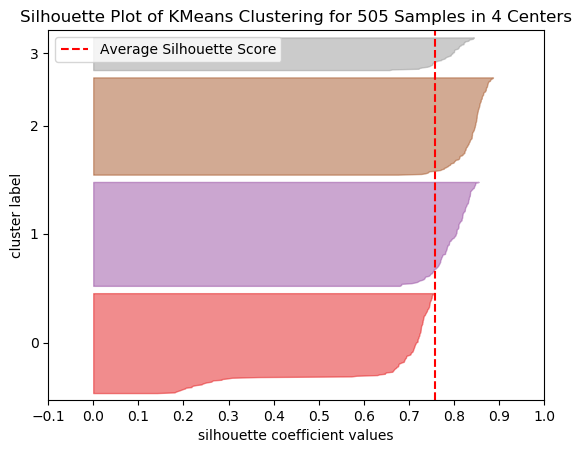

K=4, WCSS=189.70, Sil=0.76


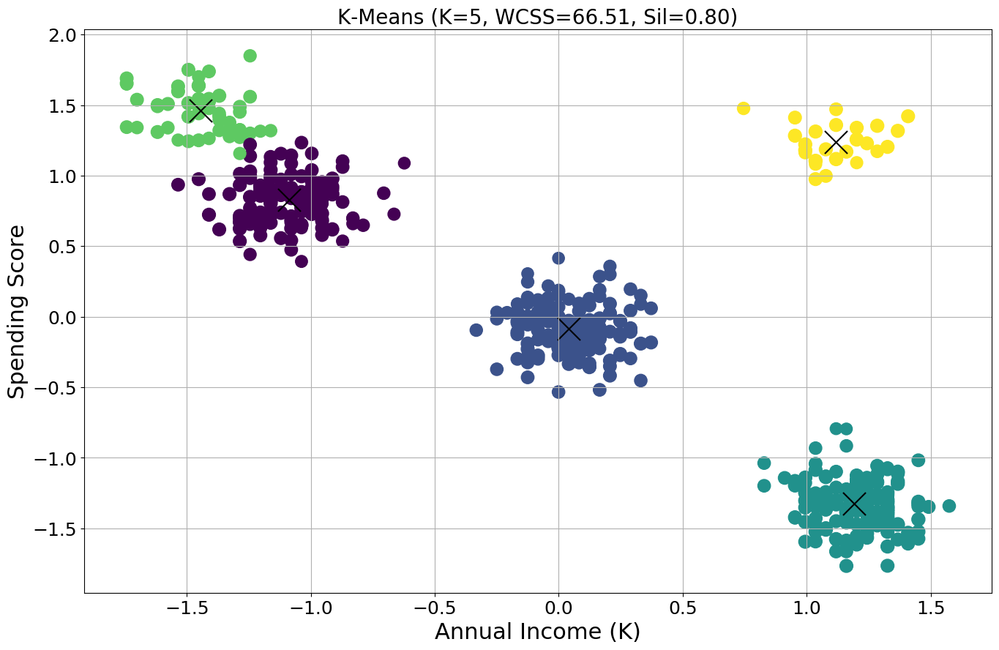

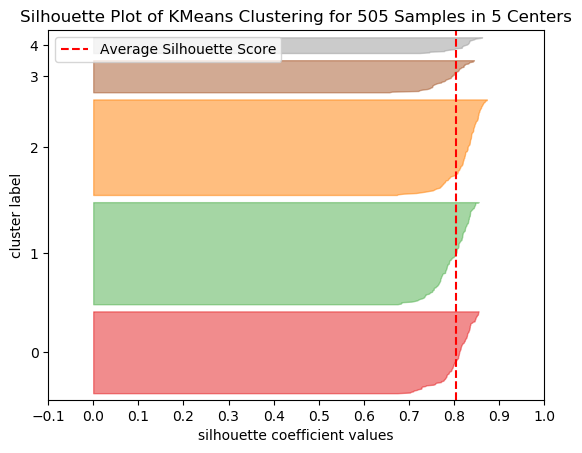

K=5, WCSS=66.51, Sil=0.80


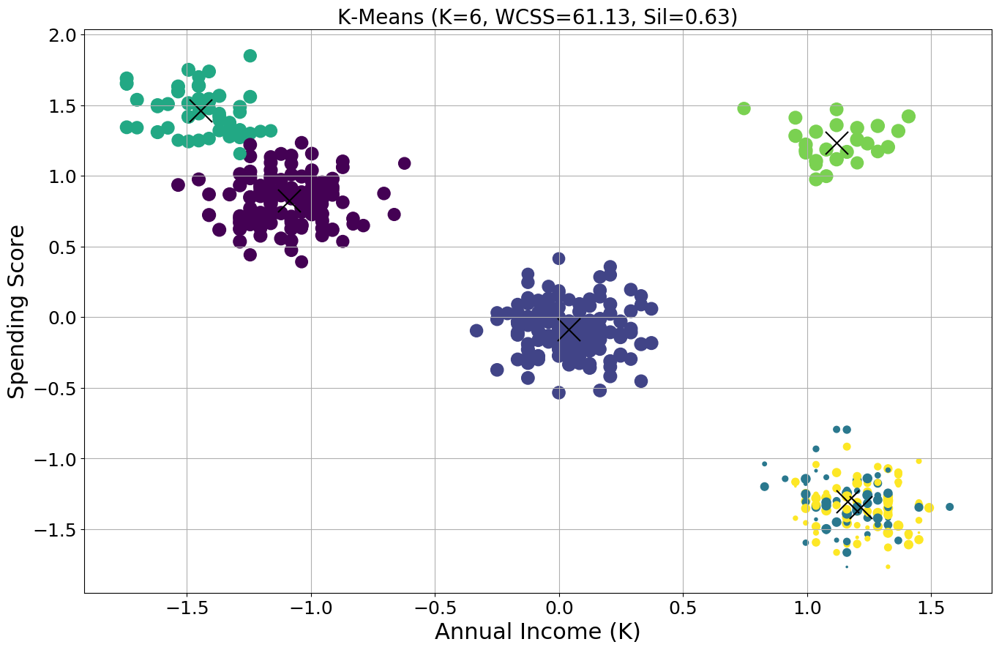

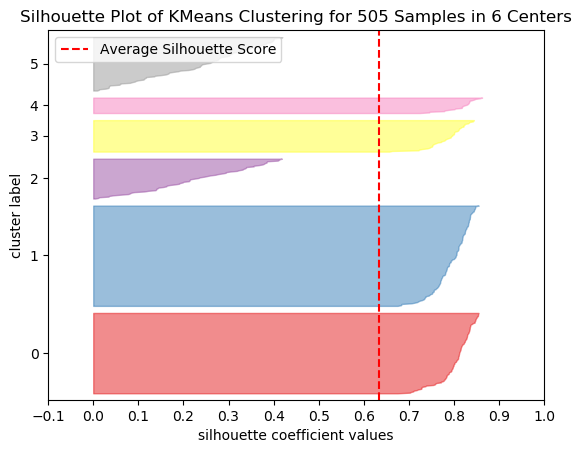

K=6, WCSS=61.13, Sil=0.63


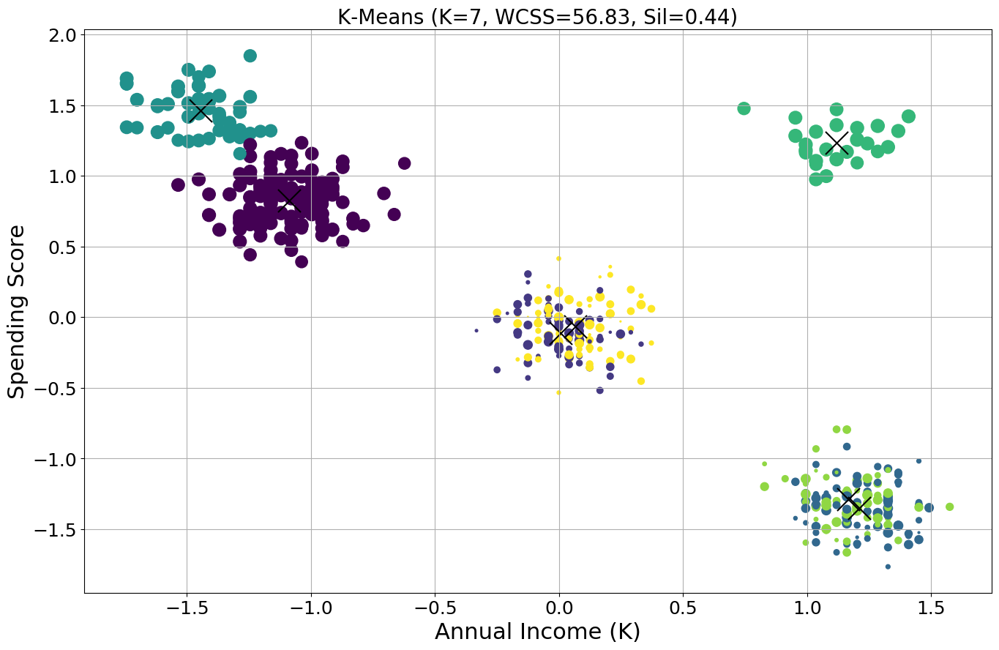

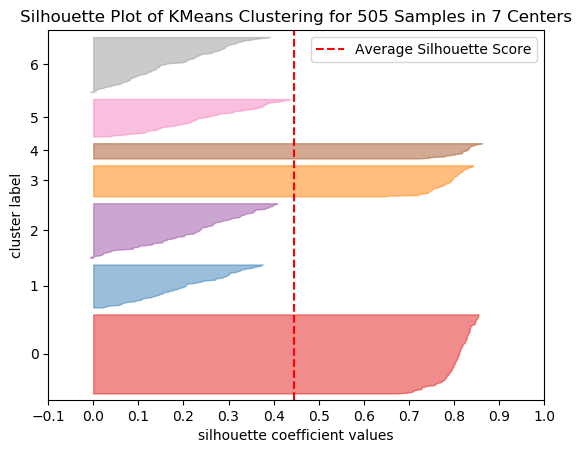

K=7, WCSS=56.83, Sil=0.44


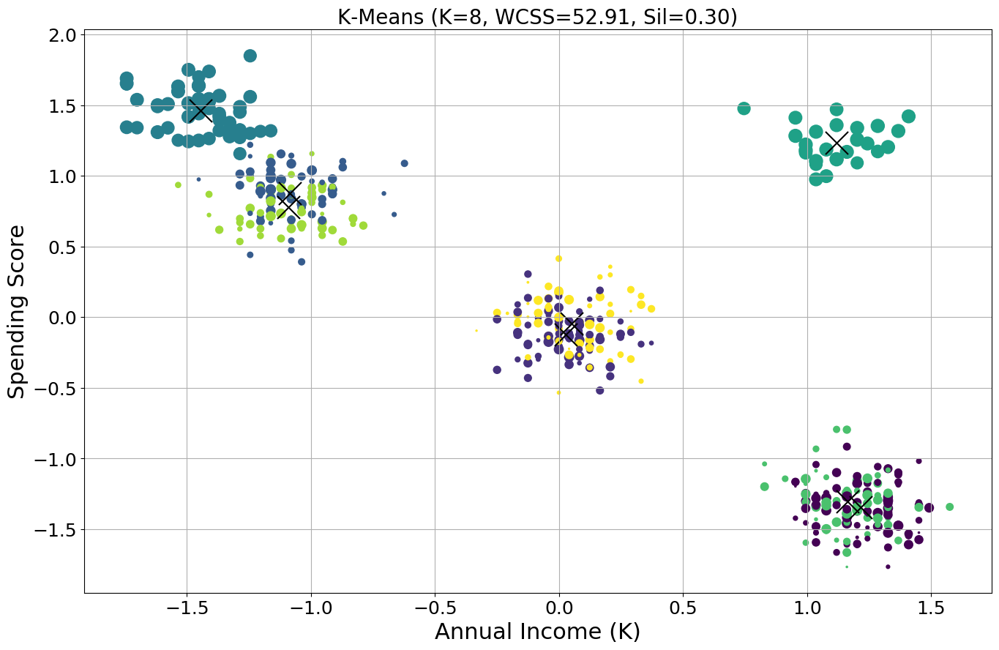

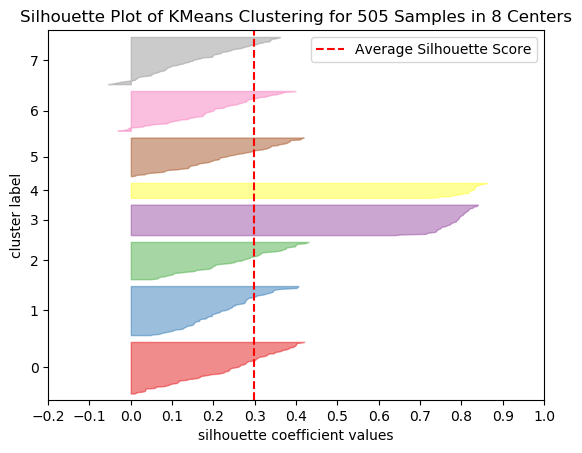

K=8, WCSS=52.91, Sil=0.30


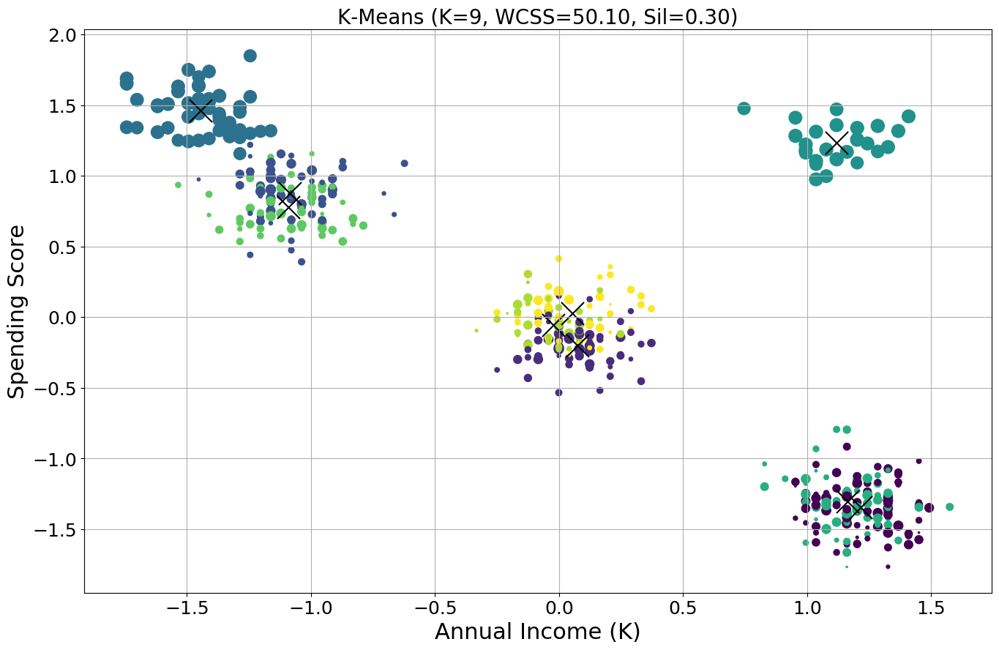

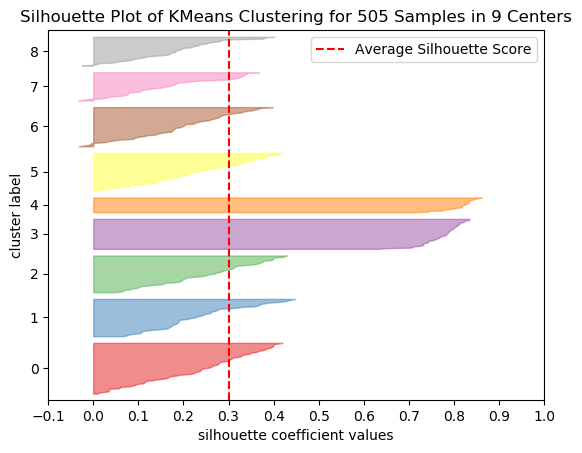

K=9, WCSS=50.10, Sil=0.30


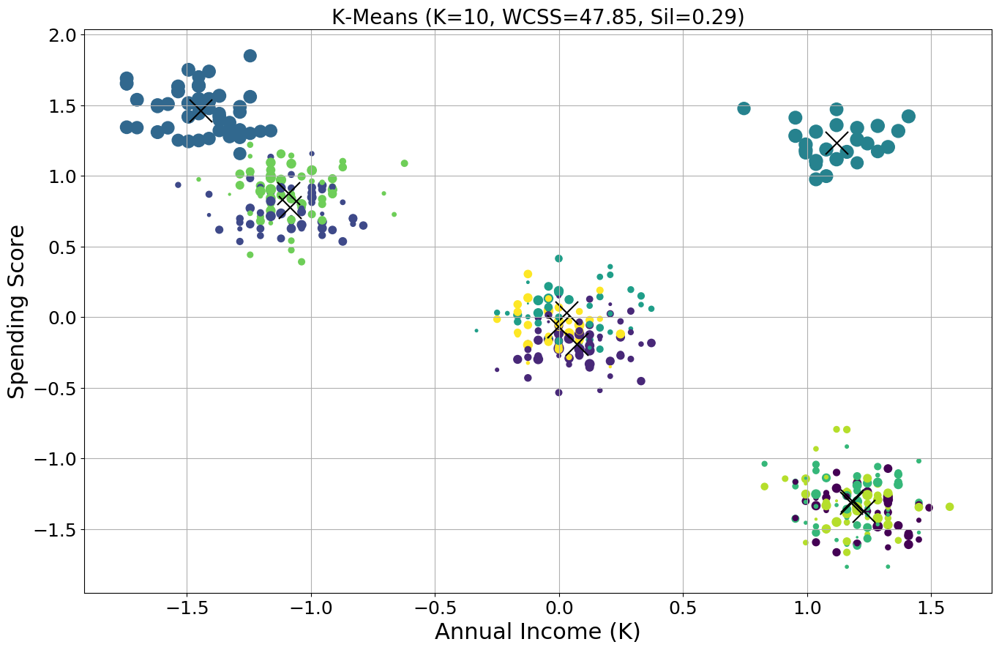

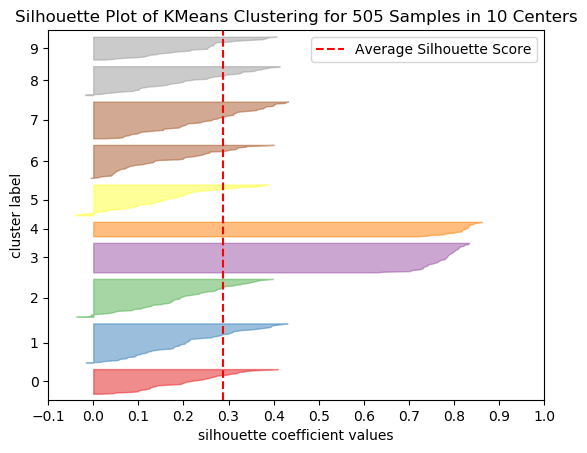

K=10, WCSS=47.85, Sil=0.29


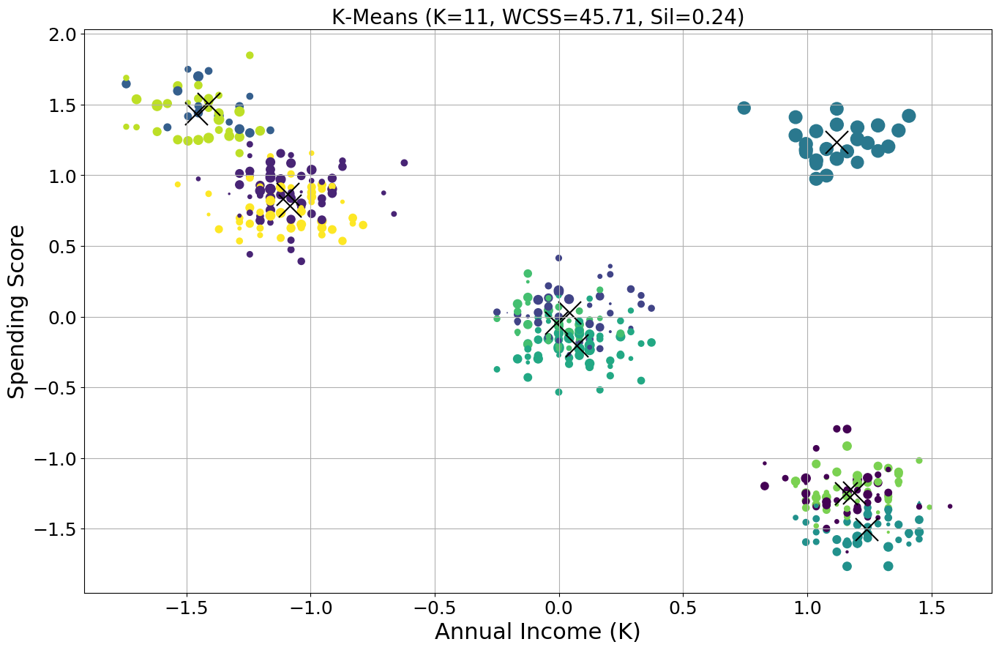

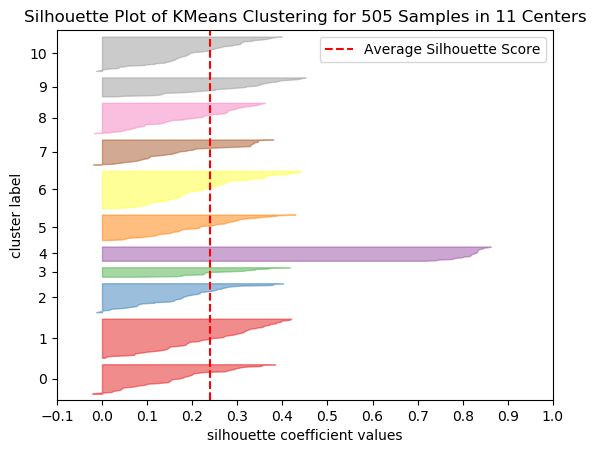

K=11, WCSS=45.71, Sil=0.24


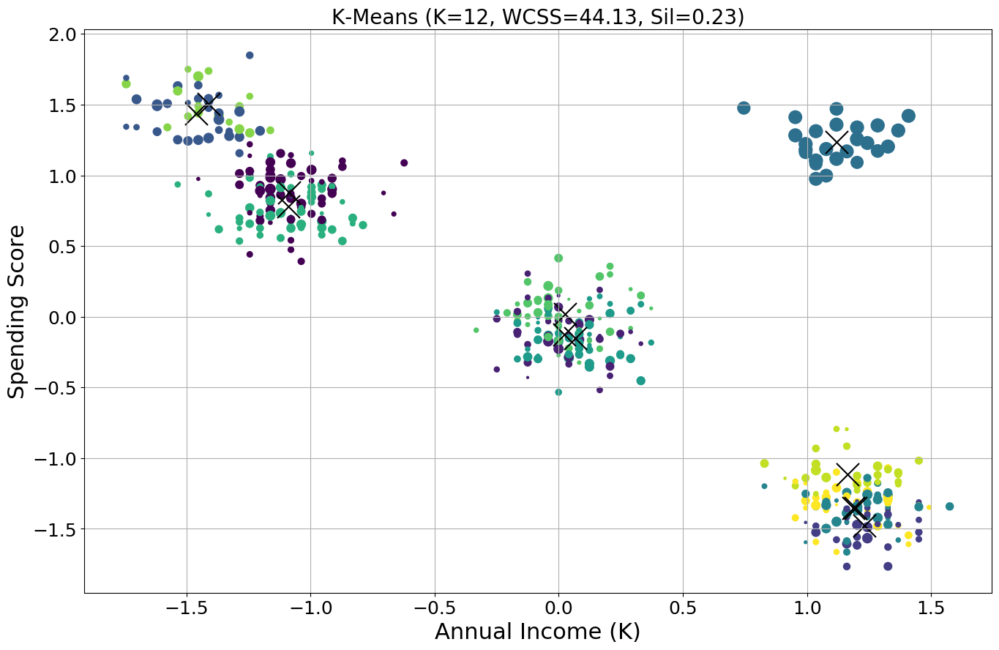

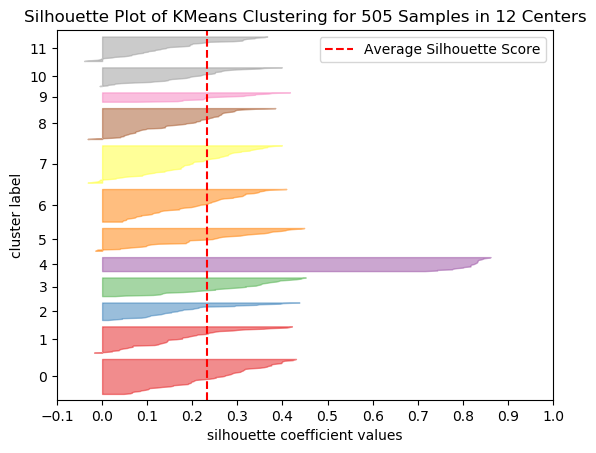

K=12, WCSS=44.13, Sil=0.23


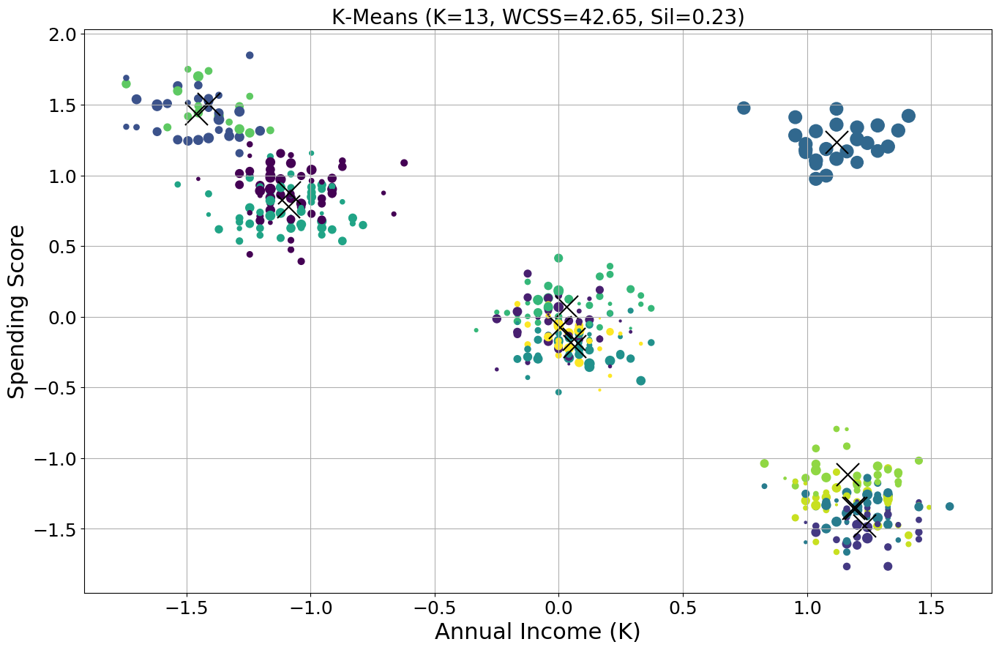

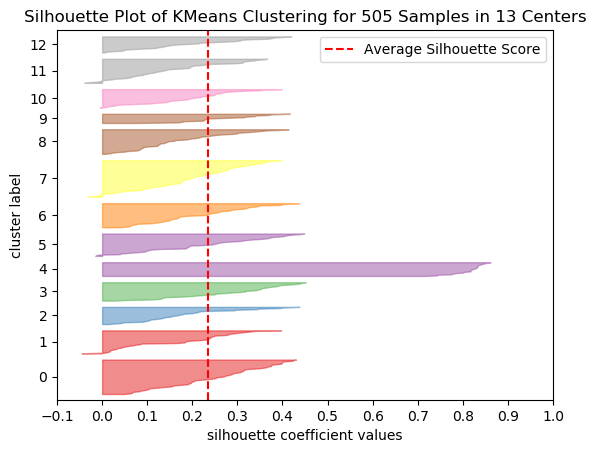

K=13, WCSS=42.65, Sil=0.23


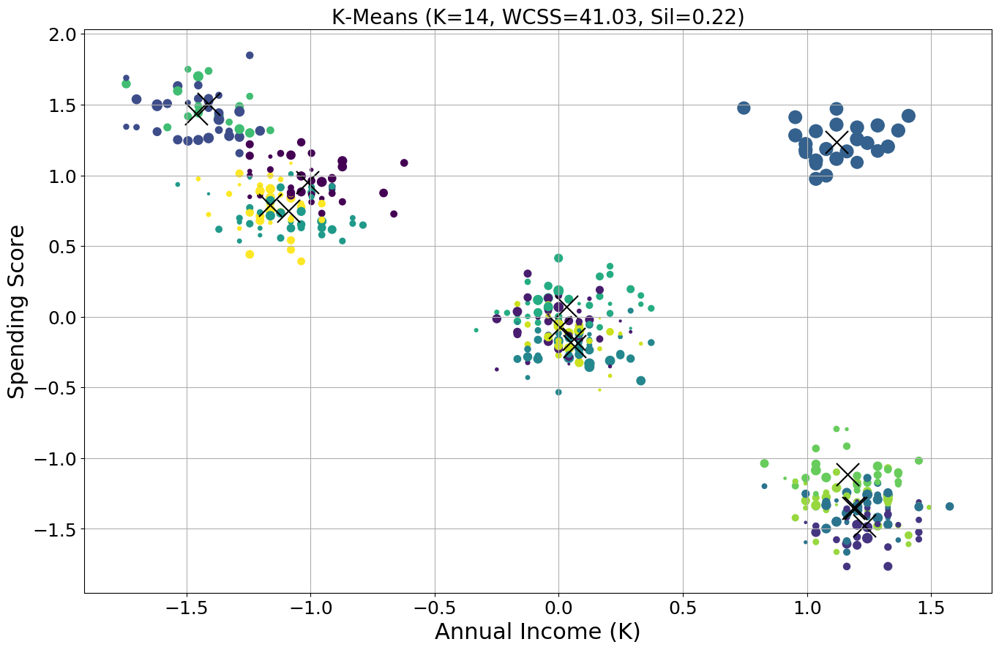

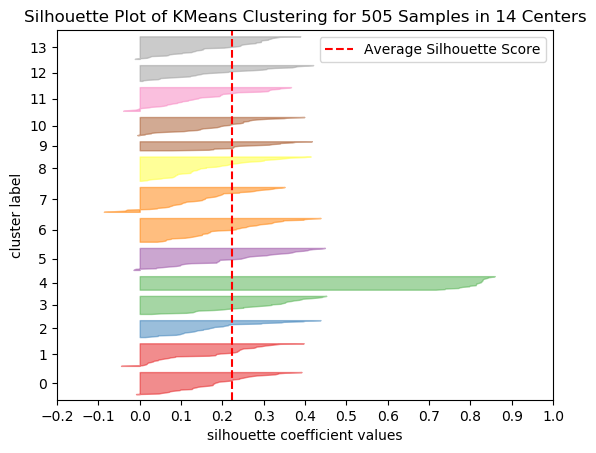

K=14, WCSS=41.03, Sil=0.22


In [49]:
def do_kmeans(df_scaled, k):
    k_means = KMeans(init='k-means++', n_clusters=k, n_init=10, random_state=28)
    k_means.fit(df_scaled)
    wcss = k_means.inertia_
    sil = silhouette_score(df_scaled, k_means.labels_)
    
    plt.style.use('default');

    sample_silhouette_values = silhouette_samples(df_scaled, k_means.labels_)
    sizes = 200*sample_silhouette_values

    plt.figure(figsize=(16, 10));
    plt.grid(True);

    plt.scatter(df_scaled.iloc[:, 0], df_scaled.iloc[:, 1], s=sizes, c=k_means.labels_)
    plt.scatter(k_means.cluster_centers_[:, 0], k_means.cluster_centers_[:, 1], marker='x', s=500, c="black")

    plt.title("K-Means (K={}, WCSS={:.2f}, Sil={:.2f})".format(k, wcss, sil), fontsize=20);
    plt.xlabel('Annual Income (K)', fontsize=22);
    plt.ylabel('Spending Score', fontsize=22);
    plt.xticks(fontsize=18);
    plt.yticks(fontsize=18);
    plt.savefig('/Users/williamchan/Desktop/plots/mall-kmeans-auto-{}-silhouette-size.png'.format(k));
    plt.show()
    
    
    visualizer = SilhouetteVisualizer(k_means)
    visualizer.fit(df_scaled)
    visualizer.poof()
    fig = visualizer.ax.get_figure()
    fig.savefig('/Users/williamchan/Desktop/plots/a1-jewl-kmeans-auto-{}-silhouette-plot.png'.format(k), transparent=False);
    
    print("K={}, WCSS={:.2f}, Sil={:.2f}".format(k, wcss, sil))

for k in range(2, 10):
    do_kmeans(df_scaled, k)

# DBSCAN Method


In [107]:
db = DBSCAN(eps=0.6, min_samples=8)
db.fit(df_scaled)

DBSCAN(algorithm='auto', eps=0.6, leaf_size=30, metric='euclidean',
       metric_params=None, min_samples=8, n_jobs=None, p=None)

In [108]:
db.labels_

array([0, 0, 0, 0, 1, 2, 0, 1, 1, 1, 3, 4, 4, 4, 0, 3, 0, 1, 1, 3, 4, 3,
       0, 1, 3, 2, 2, 0, 1, 0, 0, 0, 1, 0, 4, 0, 1, 0, 4, 4, 0, 1, 2, 0,
       0, 2, 3, 2, 4, 0, 1, 4, 2, 1, 0, 1, 4, 1, 1, 1, 1, 1, 1, 0, 0, 0,
       1, 2, 2, 0, 0, 4, 1, 1, 4, 0, 4, 0, 0, 2, 0, 3, 0, 1, 1, 4, 4, 0,
       0, 0, 0, 0, 2, 1, 0, 2, 4, 0, 0, 4, 4, 2, 4, 2, 4, 1, 1, 4, 4, 0,
       1, 4, 0, 4, 4, 4, 0, 4, 2, 1, 4, 1, 1, 1, 4, 3, 0, 1, 0, 0, 4, 0,
       4, 0, 2, 1, 3, 2, 0, 4, 1, 0, 0, 2, 0, 2, 0, 3, 0, 1, 0, 4, 1, 0,
       1, 3, 4, 0, 1, 0, 4, 1, 0, 4, 1, 4, 1, 0, 4, 0, 1, 0, 4, 0, 1, 0,
       0, 1, 1, 1, 0, 0, 4, 2, 2, 1, 4, 0, 0, 0, 4, 1, 0, 0, 0, 1, 2, 4,
       1, 1, 1, 4, 0, 4, 0, 4, 0, 1, 2, 0, 1, 1, 1, 1, 0, 1, 4, 2, 4, 1,
       0, 0, 4, 1, 4, 2, 4, 0, 0, 1, 0, 0, 1, 0, 0, 0, 4, 0, 4, 4, 2, 0,
       0, 0, 3, 0, 4, 1, 2, 2, 2, 1, 0, 4, 1, 1, 4, 4, 0, 0, 3, 0, 0, 1,
       0, 1, 4, 2, 0, 4, 1, 0, 1, 1, 4, 0, 1, 1, 0, 0, 1, 4, 4, 3, 4, 1,
       1, 4, 3, 1, 1, 2, 0, 4, 4, 0, 4, 1, 1, 4, 0,

In [109]:
silhouette_score(df_scaled, db.labels_)

0.8048976287755765

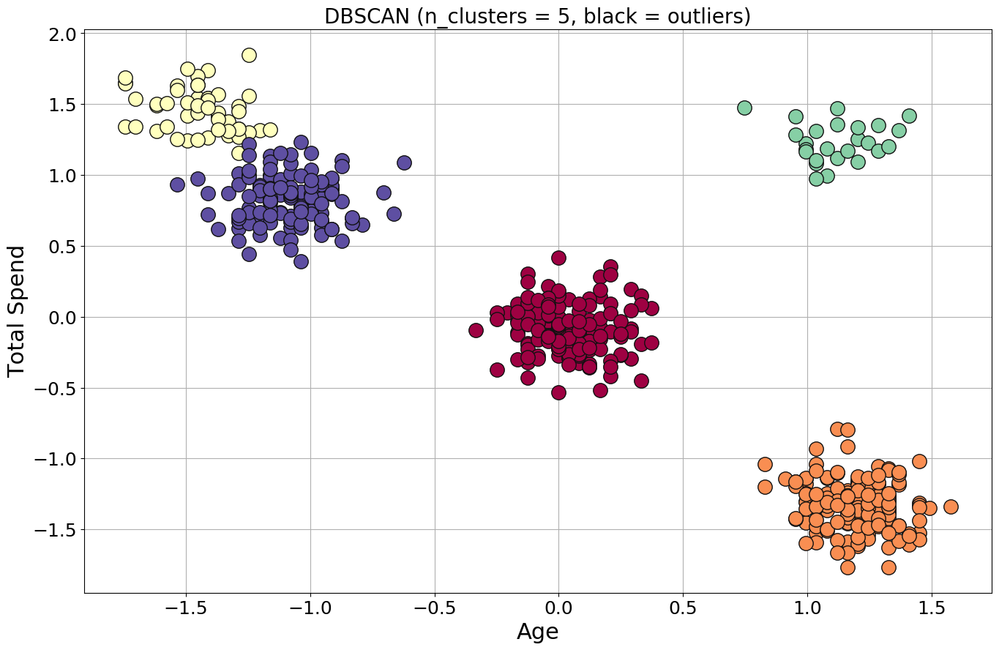

In [110]:
plt.figure(figsize=(16, 10));
plt.grid(True);

unique_labels = set(db.labels_)
colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))];

for k in unique_labels:
    if k == -1:        # Black used for noise.
        col = [0, 0, 0, 1]
    else:
        col = colors[k]

    xy = df_scaled[db.labels_ == k]
    plt.plot(xy.iloc[:, 0], xy.iloc[:, 1], 'o', markerfacecolor=tuple(col), markeredgecolor='k', markersize=14);

    
plt.title('');
plt.title("DBSCAN (n_clusters = {:d}, black = outliers)".format(len(unique_labels)), fontsize=20);
plt.xlabel('Age', fontsize=22);
plt.ylabel('Total Spend', fontsize=22);
plt.xticks(fontsize=18);
plt.yticks(fontsize=18);
plt.savefig('/Users/williamchan/Desktop/plots/a1-jewl-dbscan.png', transparent=False);

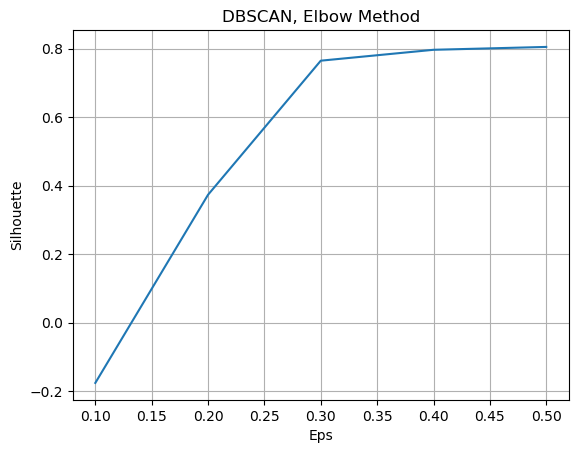

In [111]:
silhouettes = {}
for eps in np.arange(0.1, 0.6, 0.1):
    db = DBSCAN(eps=eps, min_samples=5).fit(df_scaled)
    silhouettes[eps] = silhouette_score(df_scaled, db.labels_, metric='euclidean')
    

plt.figure();
plt.plot(list(silhouettes.keys()), list(silhouettes.values()));
plt.title('DBSCAN, Elbow Method')
plt.xlabel("Eps");
plt.ylabel("Silhouette");
plt.grid(True);
plt.savefig('/Users/williamchan/Desktop/plots/mall-dbscan-silhouette.png', transparent=False);

eps=0.1, min_samples=1, n_clusters=430, sil=0.07622070845434117
eps=0.1, min_samples=2, n_clusters=48, sil=-0.5282666637526231
eps=0.1, min_samples=3, n_clusters=15, sil=-0.6313739076946371
eps=0.1, min_samples=4, n_clusters=4, sil=-0.4590423145194752
eps=0.1, min_samples=5, n_clusters=3, sil=-0.17554431615393226
eps=0.1, min_samples=6, n_clusters=2, sil=-0.17493225898474807
eps=0.1, min_samples=7, n_clusters <= 1. Returning.
eps=0.1, min_samples=8, n_clusters <= 1. Returning.
eps=0.1, min_samples=9, n_clusters <= 1. Returning.
eps=0.2, min_samples=1, n_clusters=85, sil=-0.15312504415260234
eps=0.2, min_samples=2, n_clusters=18, sil=0.03929797371993923
eps=0.2, min_samples=3, n_clusters=12, sil=0.21650895666875325
eps=0.2, min_samples=4, n_clusters=9, sil=0.29103834394984224
eps=0.2, min_samples=5, n_clusters=7, sil=0.37355056274945037
eps=0.2, min_samples=6, n_clusters=6, sil=0.33843571870862393
eps=0.2, min_samples=7, n_clusters=5, sil=0.30897875484400195
eps=0.2, min_samples=8, n_cl

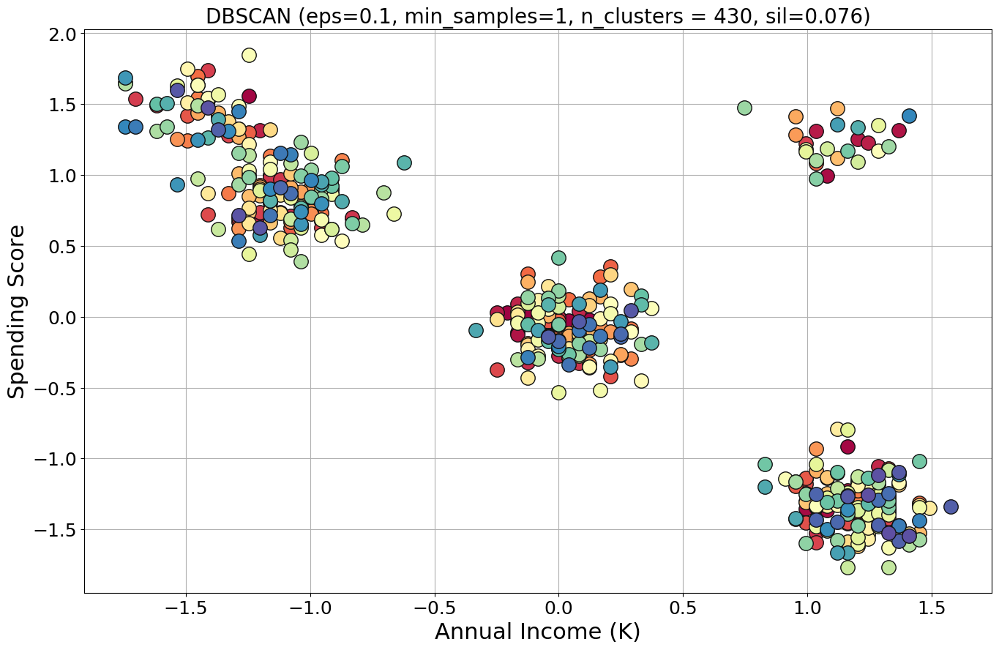

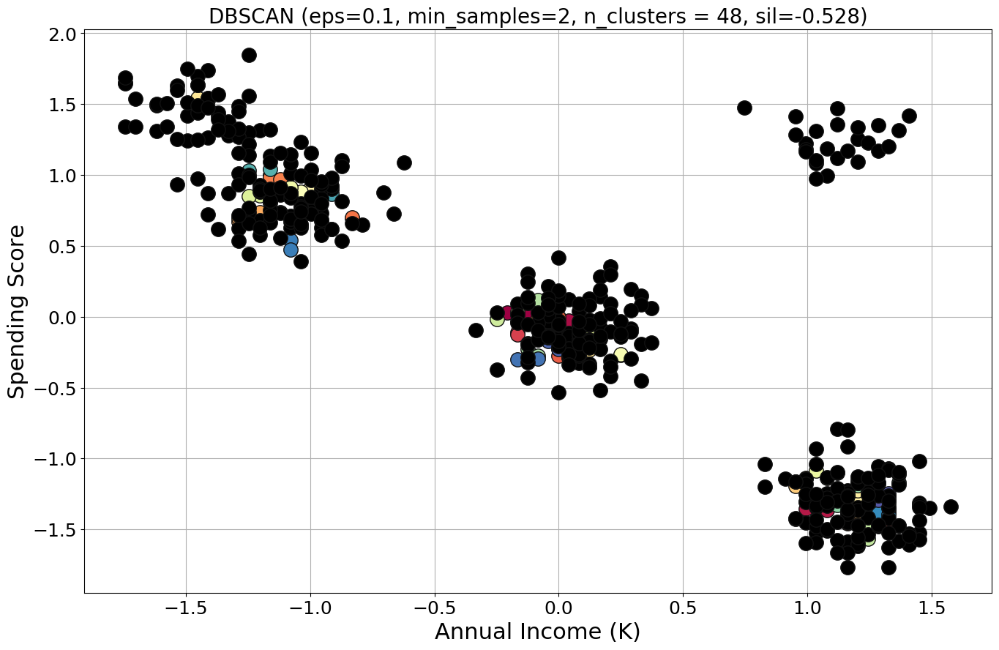

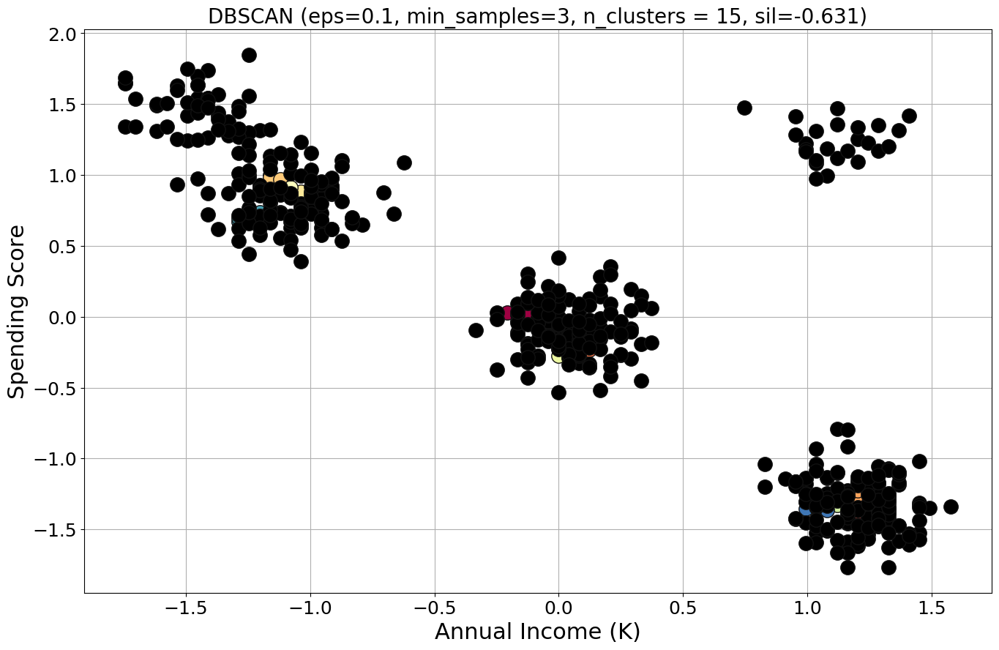

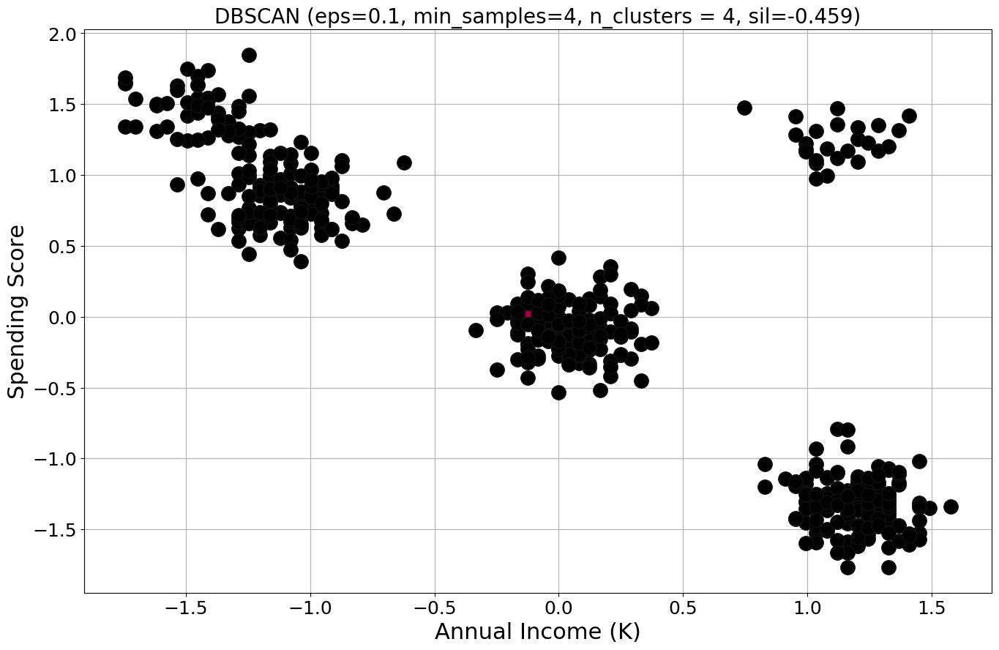

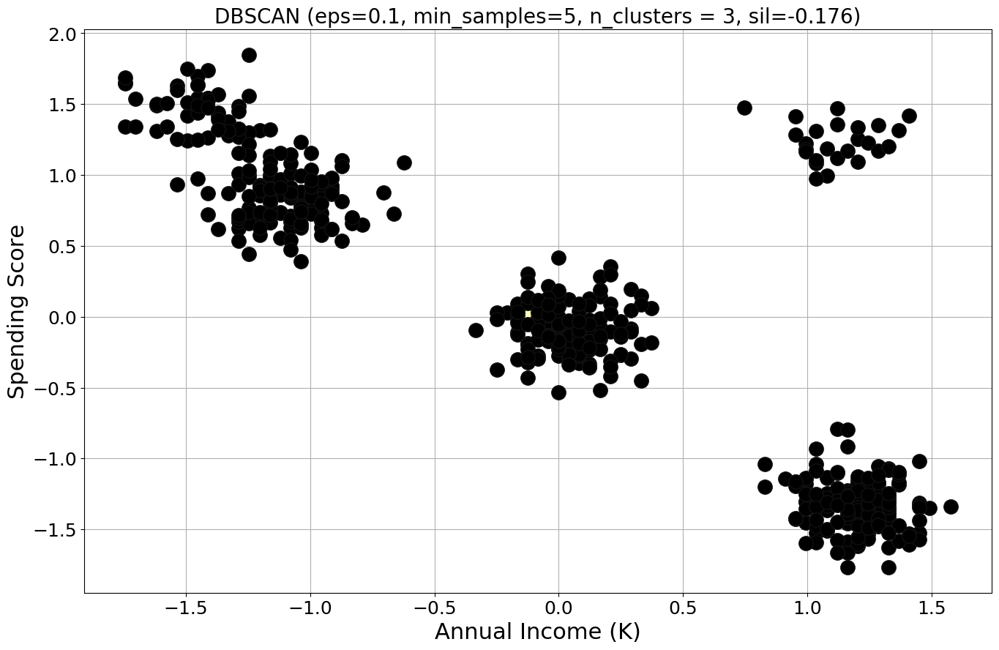

...

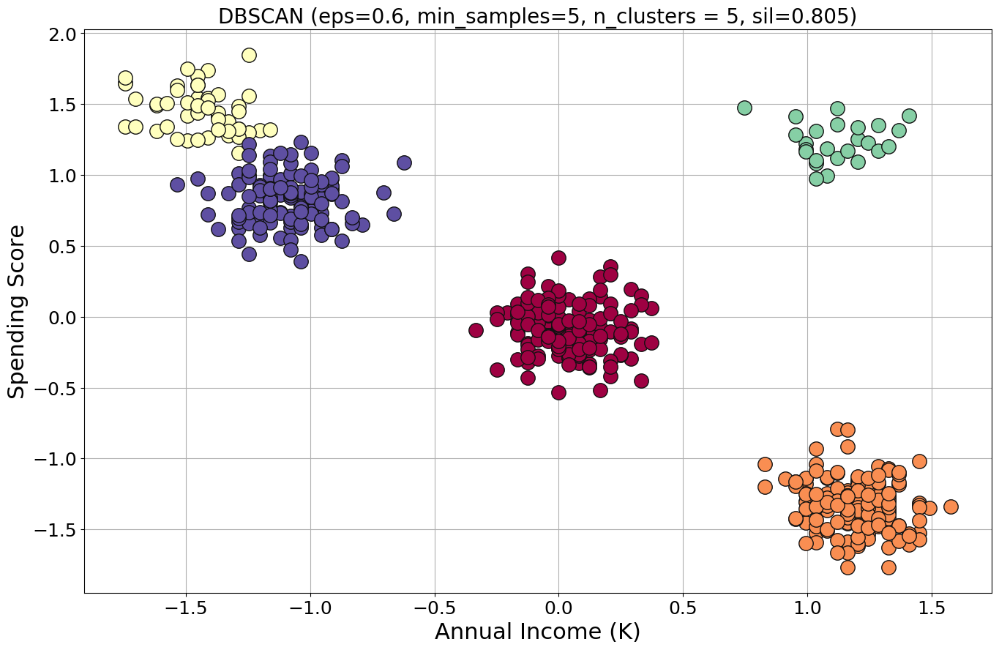

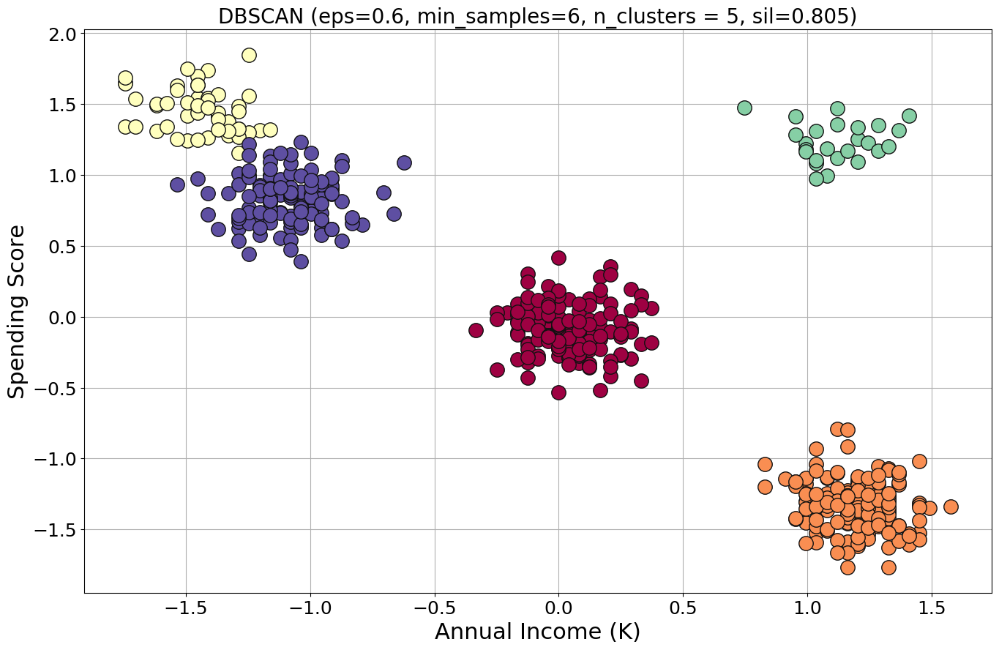

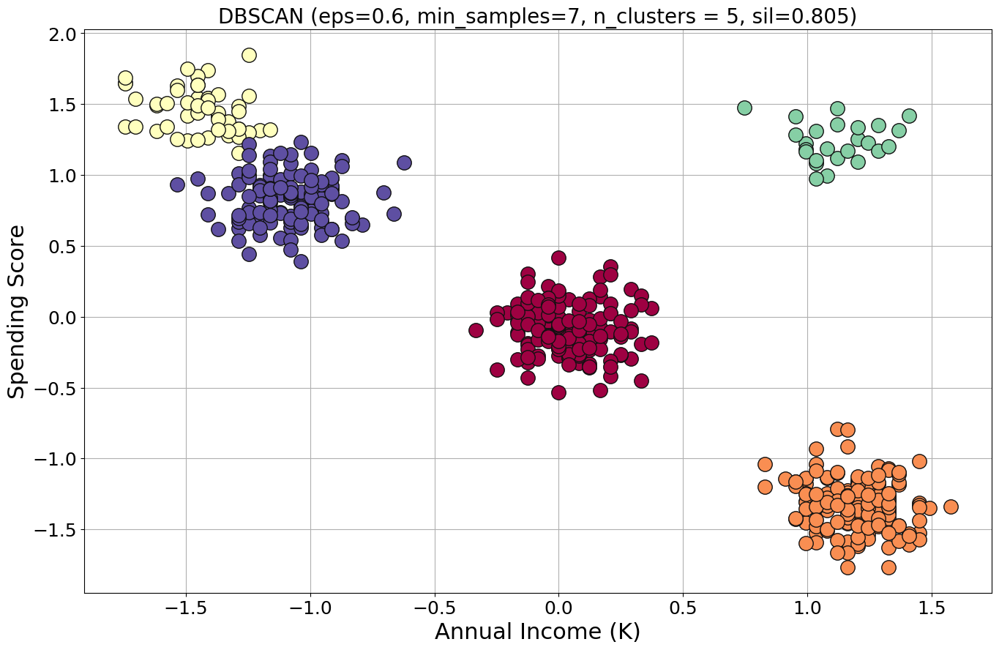

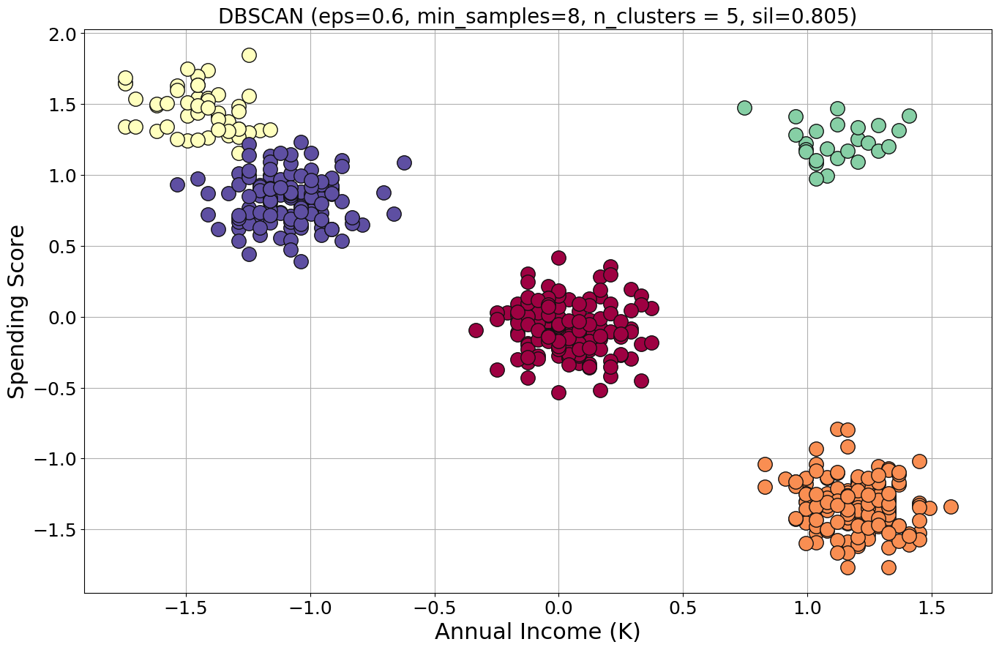

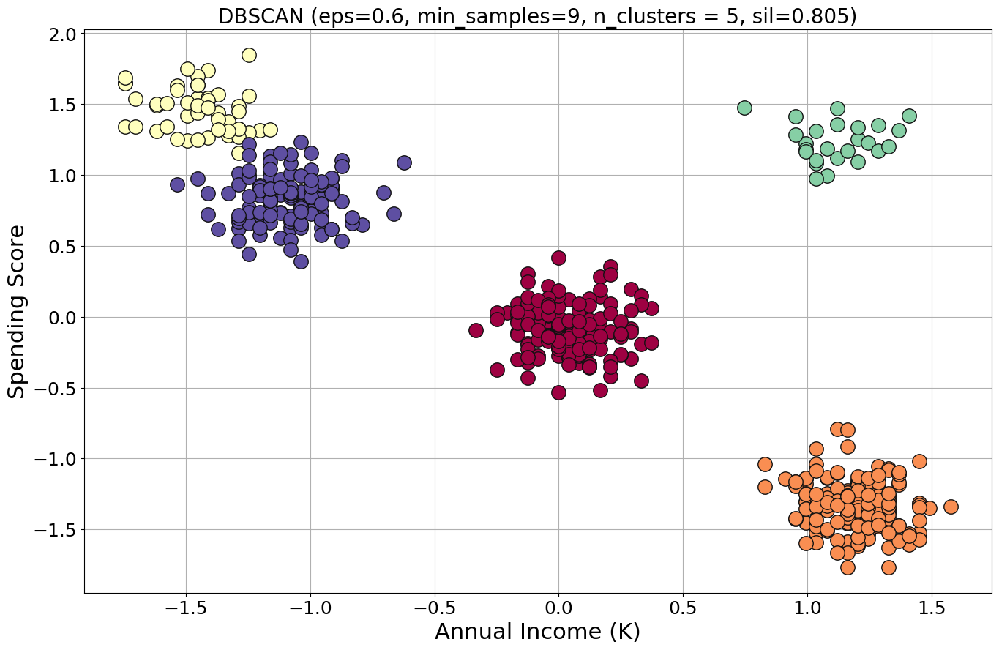

In [100]:
def do_dbscan(df_scaled, eps, min_samples):
    db = DBSCAN(eps=eps, min_samples=min_samples).fit(df_scaled)

    unique_labels = set(db.labels_)
    n_clusters = len(unique_labels)
    
    if n_clusters <= 1:
        print('eps={}, min_samples={}, n_clusters <= 1. Returning.'.format(eps, min_samples))
        return
    
    sil = silhouette_score(df_scaled, db.labels_)
    print("eps={}, min_samples={}, n_clusters={}, sil={}".format(eps, min_samples, n_clusters, sil))
    
    plt.figure(figsize=(16, 10));
    plt.grid(True);   
    
    colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))];

    for k in unique_labels:
        if k == -1:        # Black used for noise.
            col = [0, 0, 0, 1]
        else:
            col = colors[k]

        xy = df_scaled[db.labels_ == k]
        plt.plot(xy.iloc[:, 0], xy.iloc[:, 1], 'o', markerfacecolor=tuple(col), markeredgecolor='k', markersize=14);


    plt.title('');
    plt.title("DBSCAN (eps={}, min_samples={}, n_clusters = {:d}, sil={:.3f})".format(eps, min_samples, n_clusters, sil), fontsize=20);
    plt.xlabel('Annual Income (K)', fontsize=22);
    plt.ylabel('Spending Score', fontsize=22);
    plt.xticks(fontsize=18);
    plt.yticks(fontsize=18);
    plt.savefig('/Users/williamchan/Desktop/plots/a1-jewl-dbscan-auto-{}-{}.png'.format(eps, min_samples), transparent=False);
    

epss = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6]
min_samples = range(1, 10)

for prod in list(itertools.product(epss, min_samples)):
    do_dbscan(df_scaled, prod[0], prod[1])

# c. Print summary statistics for each cluster.

In [133]:
df_unscaled.head(5)

,Age,Income,SpendingScore,Savings
0,32.777778,105265.809524,0.309926,14962.778066
1,59.955414,72448.063694,0.771518,6889.972190
2,87.775510,27866.102041,0.328800,16659.261445
3,24.180000,128029.120000,0.896892,4087.520309
4,86.000000,119944.040000,0.068378,14808.683793
